In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("mnist.csv")
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(42000, 785)

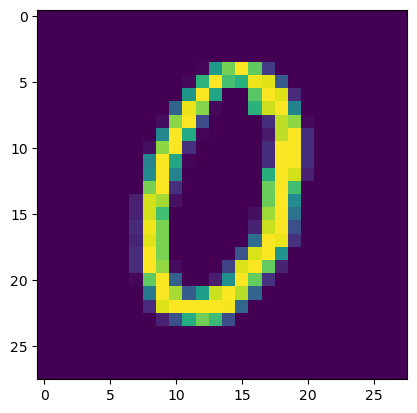

In [4]:
plt.imshow(df.iloc[5,1:].values.reshape(28,28))

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42000 entries, 0 to 41999
Columns: 785 entries, label to pixel783
dtypes: int64(785)
memory usage: 251.5 MB


In [6]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

In [7]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.2,random_state=42)

In [8]:
x_train.shape

(33600, 784)

In [9]:
x_test.shape

(8400, 784)

In [10]:
x_train.head(2)

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
34941,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24433,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
from sklearn.neighbors import KNeighborsClassifier

In [12]:
knn=KNeighborsClassifier()

In [13]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [14]:
y_pred=knn.predict(x_test)

In [15]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [16]:
from sklearn.preprocessing import StandardScaler

In [17]:
ss=StandardScaler()

In [18]:
x_train=ss.fit_transform(x_train)
x_test=ss.transform(x_test)

# PCA

In [19]:
from sklearn.decomposition import PCA
pca=PCA(n_components=200)

In [20]:
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)

In [21]:
x_train.shape, x_train_trf.shape

((33600, 784), (33600, 200))

In [22]:
knn.fit(x_train_trf,y_train)

KNeighborsClassifier()

In [23]:
y_pred_knn=knn.predict(x_test_trf)

In [24]:
accuracy_score(y_test,y_pred_knn)

0.9513095238095238

for i in range(1,785):
    pca=PCA(n_components=i)
    x_train_trf=pca.fit_transform(x_train)
    x_test_trf=pca.transform(x_test)
    knn=KNeighborsClassifier()
    knn.fit(x_train_trf,y_train)
    y_pred_k=knn.predict(x_test_trf)
    print(accuracy_score(y_test,y_pred_k))

In [25]:
x_train_trf

array([[-2.71863247, -0.48982413,  1.13549697, ...,  0.29624529,
        -0.42707669, -0.39723389],
       [-0.67698016, -6.75362493, -2.33590144, ..., -0.09927088,
        -0.8990706 , -0.78533222],
       [-3.03323283,  6.5098162 ,  7.49182985, ..., -0.52283626,
        -0.37304305, -0.95803931],
       ...,
       [ 2.1488364 ,  0.78079451, -0.74738769, ...,  1.14552904,
         0.90018368,  0.06523139],
       [ 1.05956998,  0.94767297,  3.94973081, ...,  0.543497  ,
        -0.04979435, -0.40428193],
       [17.70258451,  1.96188172, -4.94352824, ..., -0.09272176,
        -0.53897524,  1.12196407]])

In [26]:
pca=PCA(n_components=2)
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)
x_train_trf

array([[-2.71858534, -0.48933979],
       [-0.67695374, -6.75380766],
       [-3.03326677,  6.50942021],
       ...,
       [ 2.14874389,  0.7801832 ],
       [ 1.05959298,  0.94825044],
       [17.70258527,  1.96208363]])

In [27]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig=px.scatter(x=x_train_trf[:,0],
               y=x_train_trf[:,1],
              color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [28]:
pca=PCA(n_components=3)
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)
x_train_trf




array([[-2.71859123, -0.4897996 ,  1.1354121 ],
       [-0.676854  , -6.75282198, -2.33466086],
       [-3.03320096,  6.50966503,  7.49192513],
       ...,
       [ 2.14878992,  0.7804833 , -0.74789999],
       [ 1.05964334,  0.94775522,  3.95002   ],
       [17.7026682 ,  1.96210768, -4.94269611]])

In [29]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(x=x_train_trf[:,0],
               y=x_train_trf[:,1],
               z=x_train_trf[:,2],
              color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [30]:
pca.explained_variance_  # eigen values

array([40.67111197, 29.17023387, 26.74459569])

In [31]:
pca.components_.shape # eigen vectors

(3, 784)

In [32]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])